In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

from sklearn.metrics import r2_score, median_absolute_error, mean_absolute_error
from sklearn.metrics import median_absolute_error, mean_squared_error, mean_squared_log_error

from scipy.optimize import minimize
import statsmodels.tsa.api as smt
import statsmodels.api as sm

from tqdm import tqdm_notebook

from itertools import product

import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [2]:
from google.colab import drive
drive.mount('../content/drive')

Mounted at ../content/drive


In [3]:
from urllib.request import urlretrieve
url = 'https://archive.ics.uci.edu/ml/machine-learning-databases/00235/household_power_consumption.zip'
filename = 'household_power_consumption'
urlretrieve(url, filename)

('household_power_consumption', <http.client.HTTPMessage at 0x7fb9fb7a09b0>)

In [4]:
!dir

drive  household_power_consumption  sample_data


In [5]:
from zipfile import ZipFile

# Create a ZipFile Object and load sample.zip in it
with ZipFile('household_power_consumption', 'r') as zipObj:
   # Extract all the contents of zip file in current directory
   zipObj.extractall()

In [6]:
#Load the text file
df = pd.read_csv('household_power_consumption.txt', sep=';', low_memory=False, parse_dates=[[0, 1]])

In [7]:
#Preview the file
df.head()

,Date_Time,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
0,2006-12-16 17:24:00,4.216,0.418,234.840,18.400,0.000,1.000,17.0
1,2006-12-16 17:25:00,5.360,0.436,233.630,23.000,0.000,1.000,16.0
2,2006-12-16 17:26:00,5.374,0.498,233.290,23.000,0.000,2.000,17.0
3,2006-12-16 17:27:00,5.388,0.502,233.740,23.000,0.000,1.000,17.0
4,2006-12-16 17:28:00,3.666,0.528,235.680,15.800,0.000,1.000,17.0


In [8]:
#Dataframe datatypes
df.dtypes

Date_Time                datetime64[ns]
Global_active_power              object
Global_reactive_power            object
Voltage                          object
Global_intensity                 object
Sub_metering_1                   object
Sub_metering_2                   object
Sub_metering_3                  float64
dtype: object

In [9]:
df["Date_Time"] = pd.to_datetime(df["Date_Time"]) #convert column to datetime

In [10]:
df.set_index("Date_Time", inplace=True)
df

,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
Date_Time,,,,,,,
2006-12-16 17:24:00,4.216,0.418,234.840,18.400,0.000,1.000,17.0
2006-12-16 17:25:00,5.360,0.436,233.630,23.000,0.000,1.000,16.0
2006-12-16 17:26:00,5.374,0.498,233.290,23.000,0.000,2.000,17.0
2006-12-16 17:27:00,5.388,0.502,233.740,23.000,0.000,1.000,17.0
2006-12-16 17:28:00,3.666,0.528,235.680,15.800,0.000,1.000,17.0
...,...,...,...,...,...,...,...
2010-11-26 20:58:00,0.946,0.000,240.430,4.000,0.000,0.000,0.0
2010-11-26 20:59:00,0.944,0.000,240.000,4.000,0.000,0.000,0.0
2010-11-26 21:00:00,0.938,0.000,239.820,3.800,0.000,0.000,0.0


In [11]:
#Checking the null values before building a report
df.isna().sum()

Global_active_power          0
Global_reactive_power        0
Voltage                      0
Global_intensity             0
Sub_metering_1               0
Sub_metering_2               0
Sub_metering_3           25979
dtype: int64

In [12]:
#Let's check for any irregularities not captured by the isna/isnull function
count_na = 0
for values in df.values.tolist():
    for value in values:
        if value == '?':
            count_na += 1
        else:
            continue
#Print the result
print('We have {} missing values not captured by isna/isnull command'.format(count_na))

We have 155874 missing values not captured by isna/isnull command


In [13]:
# replace "?" to NaN
df.replace("?", np.nan, inplace = True)

#Let's recheck with the isna/isnull command
df.isna().sum()

Global_active_power      25979
Global_reactive_power    25979
Voltage                  25979
Global_intensity         25979
Sub_metering_1           25979
Sub_metering_2           25979
Sub_metering_3           25979
dtype: int64

In [14]:
#using a loop to change the datatypes
for column in df.select_dtypes(include=['object']).columns:
    df[[column]] = df[[column]].astype('float')

In [15]:
#check the datatype after the convertion
df.dtypes

Global_active_power      float64
Global_reactive_power    float64
Voltage                  float64
Global_intensity         float64
Sub_metering_1           float64
Sub_metering_2           float64
Sub_metering_3           float64
dtype: object

In [16]:
#fill missing values using interpolation
df = df.interpolate(method='time', limit_direction='forward')

In [17]:
df.head()

,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
Date_Time,,,,,,,
2006-12-16 17:24:00,4.216,0.418,234.84,18.4,0.0,1.0,17.0
2006-12-16 17:25:00,5.360,0.436,233.63,23.0,0.0,1.0,16.0
2006-12-16 17:26:00,5.374,0.498,233.29,23.0,0.0,2.0,17.0
2006-12-16 17:27:00,5.388,0.502,233.74,23.0,0.0,1.0,17.0
2006-12-16 17:28:00,3.666,0.528,235.68,15.8,0.0,1.0,17.0


In [18]:
#Taking the moving average
#daily
daily_data = df.resample('D').mean()
daily_data = round(daily_data, 1)
daily_data = daily_data.interpolate(method='linear', limit_direction='forward')
print(daily_data.isna().sum())
#monthly
monthly_data = df.resample('M').mean()
monthly_data = round(monthly_data, 2)

Global_active_power      0
Global_reactive_power    0
Voltage                  0
Global_intensity         0
Sub_metering_1           0
Sub_metering_2           0
Sub_metering_3           0
dtype: int64


In [19]:
from fbprophet import Prophet

#A function for metrics
def metrics(y_true, y_pred):
  mape = np.mean(np.abs((y_true - y_pred) / y_true)) * 100
  mse = mean_squared_error(y_true, y_pred)
  rmse = np.sqrt(mse)
  return ("MAPE = {}, \n RMSE = {}".format(mape, rmse))

#using a function
def modelling(data, target, split_size, model):
  split_size = 100 * split_size
  split_size = int((len(data)/100) * split_size)
  data.interpolate(method='linear')
  """
  Using a function to do either a univariate or multivariate forecasting with fbprophet."""
  if model == 'univariate':
    data = data.reset_index()
    columns= data.columns[1:]
    X = data.drop(columns=(columns)) 
    y = data[target]
    X = X.rename(columns={"Date_Time": "ds"})
    y = pd.Series(data=y, name=("y"))
    x_train, y_train, x_test, y_test = X[:split_size], y[:split_size], X[split_size:], y[split_size:]
    train_model = pd.concat([x_train, y_train], axis=1, sort=False)
    test = pd.concat([x_test, y_test], axis=1, sort=False)
    model = Prophet(daily_seasonality=True)
    model.fit(train_model)
    forecast = model.predict(x_test)
    return (forecast, test)

  elif model == 'multivariate':

    data = data.reset_index()
    X = data.drop(columns=(target))
    y = data[target]
    X.rename(columns={"Date_Time": "ds"}, inplace=True)
    y = pd.Series(data=y, name=("y"))
    x_train, y_train, x_test, y_test = X[:split_size], y[:split_size], X[split_size:], y[split_size:]
    train_model = pd.concat([x_train, y_train], axis=1, sort=False)
    test = pd.concat([x_test['ds'], y_test], axis=1, sort=False)
    model = Prophet(daily_seasonality=True)
    for column in data.columns:
      if column != target and column != 'Date_Time':
        model.add_regressor(column)
    model.fit(train_model)
    forecast = model.predict(x_test)
    return (forecast, test)

In [20]:
#make predictions
forecast, test = modelling(data=daily_data, target='Global_active_power', split_size=0.7, model='univariate')

metric_df = forecast.set_index('ds')[['yhat']].join(test.set_index('ds')).reset_index()
metric_df.yhat = round(metric_df.yhat, 1)

#take the metrics
metrics(metric_df.y, metric_df.yhat)

             ds    y
0    2006-12-16  3.1
1    2006-12-17  2.4
2    2006-12-18  1.5
3    2006-12-19  1.2
4    2006-12-20  1.5
...         ...  ...
1014 2009-09-25  0.8
1015 2009-09-26  1.1
1016 2009-09-27  1.0
1017 2009-09-28  0.9
1018 2009-09-29  0.8

[1019 rows x 2 columns]


INFO:numexpr.utils:NumExpr defaulting to 2 threads.


'MAPE = 26.993886461359907, \n RMSE = 0.33394179625747844'

In [ ]:
from

TypeError: ignored

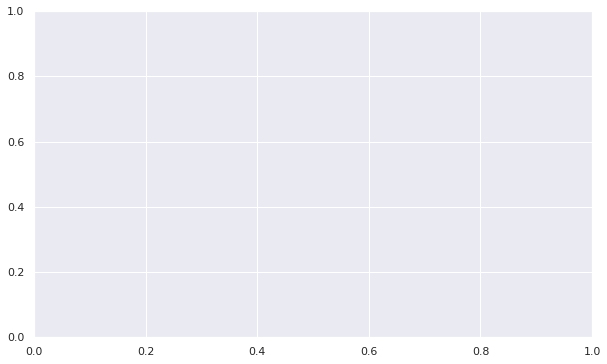

In [21]:
model.plot(forecast)

Stationarity

In [ ]:
#selecting a column

#Columns to drop
columns = df.columns[1:]
columns
#dropping the column
df_copy = df.drop(columns=(columns))

df_copy.head()

#Check missing values
df_copy.isna().sum()

#Round the dataframe values to a 1 decimal place
df_copy = round(df_copy, 1)

In [ ]:
#Performing a moving average plot
def plot_moving_average(data, window, plot_intervals=False, scale=1.96):
    
    series = data.copy()
    rolling_mean = series.rolling(window=window).mean()
    plt.figure(figsize=(17,8))
    plt.title('Moving average\n window size = {}'.format(window))
    plt.plot(rolling_mean, 'g', label='Rolling mean trend')
    
    #Plot confidence intervals for smoothed values
    if plot_intervals:
        mae = mean_absolute_error(series[window:], rolling_mean[window:])
        deviation = np.std(series[window:] - rolling_mean[window:])
        lower_bound = rolling_mean - (mae + scale * deviation)
        upper_bound = rolling_mean + (mae + scale * deviation)
        plt.plot(upper_bound, 'r--', label='Upper bound / Lower bound')
        plt.plot(lower_bound, 'r--')
            
    plt.plot(series[window:], label='Actual values')
    plt.legend(loc='best')
    plt.grid(True)


 
#Decomposed time series plot function
import statsmodels.api as sm
from pylab import rcParams

def plot_data(data):
    if data.isna().sum().any() == True:
        data.interpolate(method='linear', limit_direction='forward')
    rcParams['figure.figsize'] = 15, 8
    col = data.copy()
    try:
        decompose_series = sm.tsa.seasonal_decompose(col, model='additive')
    except (ValueError):
        decompose_series = sm.tsa.seasonal_decompose(col, model='additive', period=12)
    decompose_series.plot()
    plt.xlabel('Time')
    plt.xticks()
    plt.grid(False)
    plt.show()


#performing an exponential smoothing

def exponential_smoothing(data, alpha):
    series = data.copy()
    result = [series[0]] # first value is same as series
    for n in range(1, len(series)):
        result.append(alpha * series[n] + (1 - alpha) * result[n-1])
    return result

#plot the exponential smoothing
def plot_exponential_smoothing(data, alphas):
    series = data.copy()
    plt.figure(figsize=(17, 8))
    for alpha in alphas:
        plt.plot(exponential_smoothing(data, alpha), label="Alpha {}".format(alpha))
    plt.plot(series.values, "c", label = "Actual")
    plt.legend(loc="best")
    plt.axis('tight')
    plt.title("Exponential Smoothing")
    plt.grid(True)


#A double exponential smoothing
def double_exponential_smoothing(data, alpha, beta):
    series = data.copy()
    result = [series[0]]
    for n in range(1, len(series)+1):
        if n == 1:
            level, trend = series[0], series[1] - series[0]
        if n >= len(series): # forecasting
            value = result[-1]
        else:
            value = series[n]
        last_level, level = level, alpha * value + (1 - alpha) * (level + trend)
        trend = beta * (level - last_level) + (1 - beta) * trend
        result.append(level + trend)
    return result

def plot_double_exponential_smoothing(data, alphas, betas):
    series = data.copy()
    plt.figure(figsize=(17, 8))
    for alpha in alphas:
        for beta in betas:
            plt.plot(double_exponential_smoothing(series, alpha, beta), label="Alpha {}, beta {}".format(alpha, beta))
    plt.plot(series.values, label = "Actual")
    plt.legend(loc="best")
    plt.axis('tight')
    plt.title("Double Exponential Smoothing")
    plt.grid(True)


def tsplot(y, lags=None, figsize=(12, 7), style='bmh'):
        
    with plt.style.context(style='bmh'):
        fig = plt.figure(figsize=figsize)
        layout = (2,2)
        ts_ax = plt.subplot2grid(layout, (0,0), colspan=2)
        acf_ax = plt.subplot2grid(layout, (1,0))
        pacf_ax = plt.subplot2grid(layout, (1,1))
        
        y.plot(ax=ts_ax)
        p_value = sm.tsa.stattools.adfuller(y)[1]
        ts_ax.set_title('Time Series Analysis Plots\n Dickey-Fuller: p={0:.5f}'.format(p_value))
        smt.graphics.plot_acf(y, lags=lags, ax=acf_ax)
        smt.graphics.plot_pacf(y, lags=lags, ax=pacf_ax)
        plt.tight_layout()

In [ ]:
#plotting by a window size of 12 monthly MA
plot_moving_average(data=monthly_data, window=12)

In [ ]:
plot_data(monthly_data)

In [ ]:
#trying out single exponential plot
plot_exponential_smoothing(monthly_data.Global_active_power, [0.05, 0.3])

In [ ]:
plot_double_exponential_smoothing(monthly_data.Global_active_power, alphas=[0.9, 0.02], betas=[0.9, 0.02])

In [ ]:
tsplot(monthly_data.Global_active_power, lags=30)

<center>The decomposed time series show no trend but seasonality variations. 
The moving averaqe showed a close steady trend. Let's perform an ADF test to check for stationarity</center>

In [ ]:
from statsmodels.tsa.stattools import adfuller
adf_result = adfuller(monthly_data.Global_active_power)
print(f'ADF Statistic: {adf_result[0]}')
print(f'p-value: {adf_result[1]}')
print(f'No. of lags used: {adf_result[2]}')
print(f'No. of observations used : {adf_result[3]}')
print('Critical Values:')
for k, v in adf_result[4].items():
    print(f'   {k}: {v}')

ADF Statistic: -2.679499148872548
p-value: 0.07765349093435453
No. of lags used: 11
No. of observations used : 37
Critical Values:
   1%: -3.6209175221605827
   5%: -2.9435394610388332
   10%: -2.6104002410518627


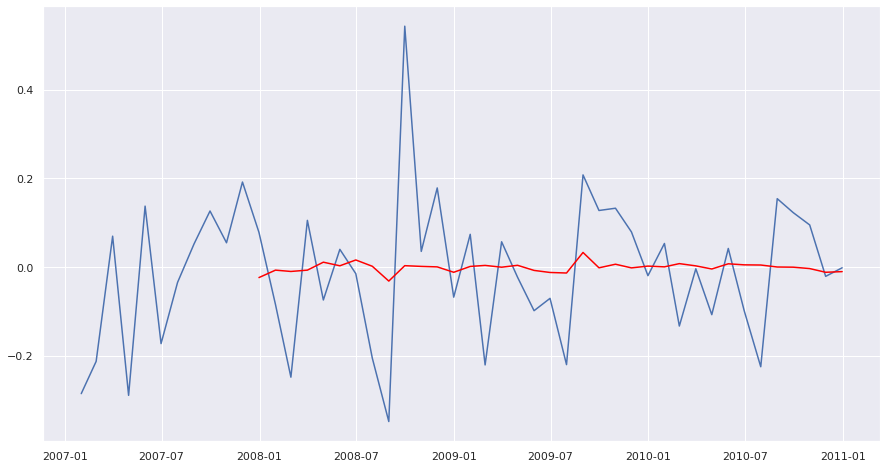

In [ ]:
#From the results obtained, the p-value is greater than the critical value at a 5% #significance level and, 
#the ADF statistic is greater than the critical value at a 5% significance level. 
#This confirms that the series is indeed non-stationary.

df_log = np.log(monthly_data)
df_diff = df_log.diff(periods=1)
plt.plot(df_diff.index, df_diff.Global_active_power, '-')
plt.plot(df_diff.rolling(12).mean(), color='red')

In [ ]:
#Quarterly 
quarterly_data = df_copy.resample('3M').mean()

In [ ]:
plot_data(quarterly_data)

In [ ]:
#quarterly adf
adf_result2 = adfuller(quarterly_data.Global_active_power)
print(f'ADF Statistic: {adf_result2[0]}')
print(f'p-value: {adf_result2[1]}')
print(f'No. of lags used: {adf_result2[2]}')
print(f'No. of observations used : {adf_result2[3]}')
print('Critical Values:')
for k, v in adf_result2[4].items():
    print(f'   {k}: {v}')

In [ ]:
#trying out single exponential plot
plot_exponential_smoothing(quarterly_data.Global_active_power, [0.05, 0.3])

In [ ]:
plot_double_exponential_smoothing(quarterly_data.Global_active_power, alphas=[0.9, 0.02], betas=[0.9, 0.02])

In [ ]:
#quarterly differencing

df_log = np.log(quarterly_data)
df_diff2 = df_log.diff(periods=1)
plt.plot(df_diff2.index, df_diff2.Global_active_power, '-')
plt.plot(df_diff2.rolling(4).mean(), color='red')

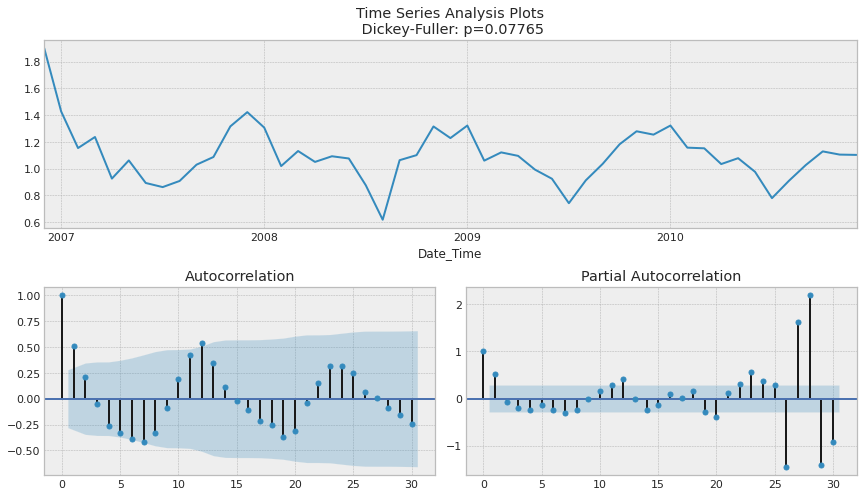

In [ ]:
tsplot(monthly_data.Global_active_power, lags=30)

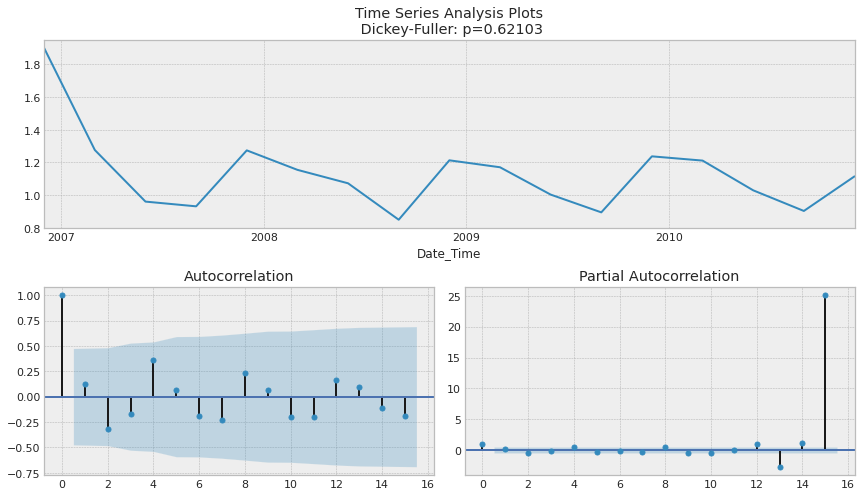

In [ ]:
tsplot(quarterly_data.Global_active_power, lags=15)

In [ ]:
#MAPE
def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

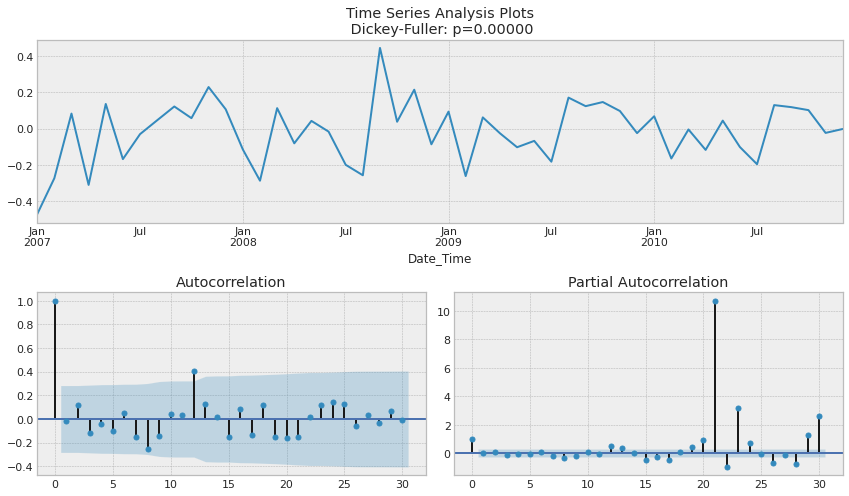

In [ ]:
#Monthly differenc
data_diff = monthly_data.Global_active_power - monthly_data.Global_active_power.shift(1)

tsplot(data_diff[1:], lags=30)

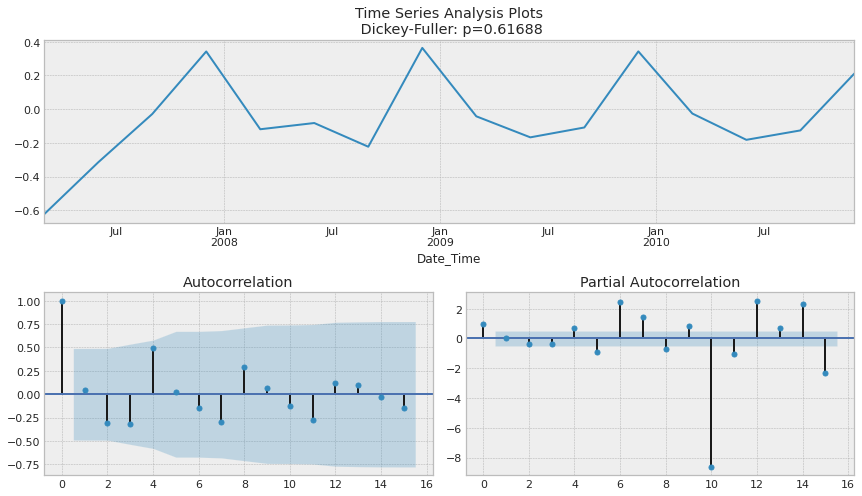

In [ ]:
#Quarterly difference
data_diff2 = quarterly_data.Global_active_power - quarterly_data.Global_active_power.shift(1)

tsplot(data_diff2[1:], lags=15)

In [ ]:
df_diff.isna().sum()

Global_active_power    1
dtype: int64

In [ ]:
df_diff = df_diff.fillna(method='bfill')

In [ ]:
df_diff.isna().sum()

Global_active_power    0
dtype: int64

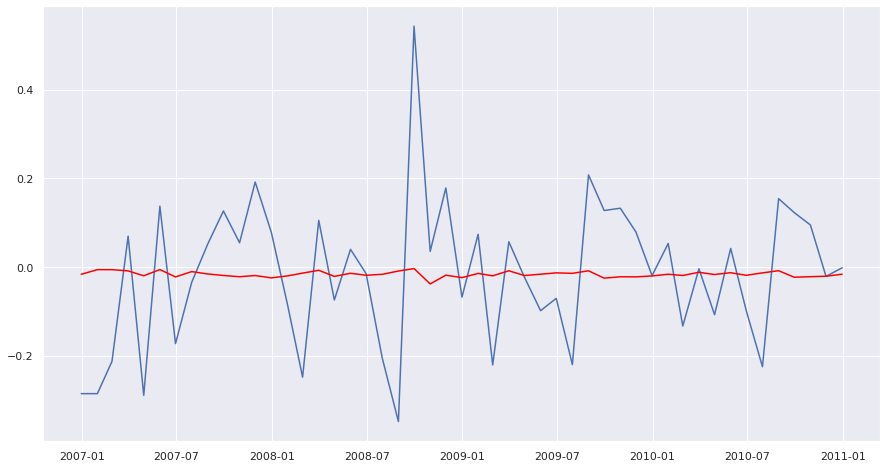

In [ ]:
#The shaded regions in the plots are the confidence intervals. The lags where the PACF and #ACF charts cross this region are the values for p and q respectively. 
#In the ACF plot, there is one lag that crosses the significance level hence, q=1. Similarly #in the PACF plot, p=1

#AR, MA and ARIMA
from statsmodels.tsa.arima_model import ARIMA
#(p,d,q)
AR_model = ARIMA(df_diff, order=(1,0,0))
AR_model_results = AR_model.fit()
plt.plot(df_diff)
plt.plot(AR_model_results.fittedvalues, color='red')

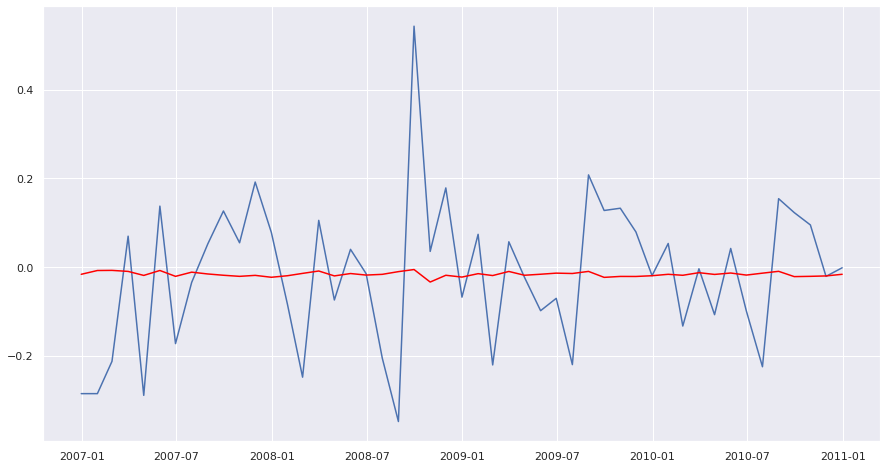

In [ ]:
MA_model = ARIMA(df_diff, order=(0,0,1))
MA_model_results = MA_model.fit()
plt.plot(df_diff)
plt.plot(MA_model_results.fittedvalues, color='red')

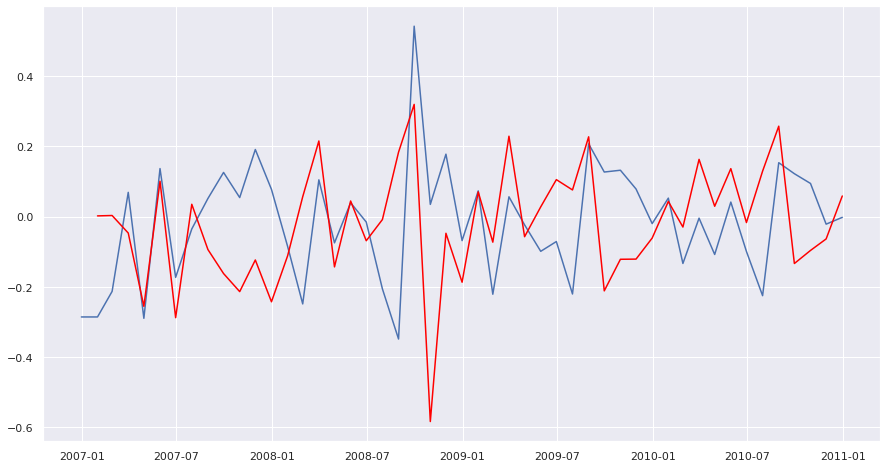

In [ ]:
#passing a difference of 1
ARIMA_model = ARIMA(df_diff, order=(1,1,1))
ARIMA_results = ARIMA_model.fit()
plt.plot(df_diff)
plt.plot(ARIMA_results.fittedvalues, color='red')

In [ ]:
ARIMA_results.fittedvalues

Date_Time
2007-01-31    0.002120
2007-02-28    0.003228
2007-03-31   -0.046762
2007-04-30   -0.255710
2007-05-31    0.100889
2007-06-30   -0.288073
2007-07-31    0.035213
2007-08-31   -0.093877
2007-09-30   -0.162247
2007-10-31   -0.213773
2007-11-30   -0.123600
2007-12-31   -0.242756
2008-01-31   -0.111702
2008-02-29    0.056743
2008-03-31    0.215690
2008-04-30   -0.143289
2008-05-31    0.044587
2008-06-30   -0.068747
2008-07-31   -0.008379
2008-08-31    0.183823
2008-09-30    0.319980
2008-10-31   -0.584177
2008-11-30   -0.047460
2008-12-31   -0.186961
2009-01-31    0.070500
2009-02-28   -0.072759
2009-03-31    0.229277
2009-04-30   -0.057235
2009-05-31    0.027884
2009-06-30    0.105496
2009-07-31    0.076097
2009-08-31    0.227572
2009-09-30   -0.211634
2009-10-31   -0.121588
2009-11-30   -0.121094
2009-12-31   -0.061070
2010-01-31    0.043279
2010-02-28   -0.029662
2010-03-31    0.163289
2010-04-30    0.029585
2010-05-31    0.136791
2010-06-30   -0.016900
2010-07-31    0.129722
2

In [ ]:
daily_data.reset_index().columns[1:]

Index(['Global_active_power', 'Global_reactive_power', 'Voltage',
       'Global_intensity', 'Sub_metering_1', 'Sub_metering_2',
       'Sub_metering_3'],
      dtype='object')

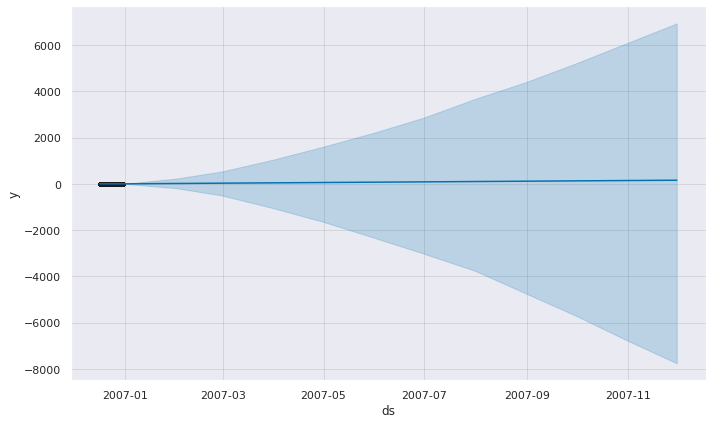

In [ ]:
model.plot(forecast)
plt.show()

In [ ]:
metric_df = forecast.set_index('ds')[['yhat']].join(df_copy2.set_index('ds').y).reset_index()

NameError: ignored

In [ ]:
metric_df.dropna(inplace=True)

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

In [ ]:
mean_squared_error(metric_df.y, metric_df.yhat)
rmse = np.sqrt(mse)

88.17754007572628

In [ ]:
mean_absolute_error(metric_df.y, metric_df.yhat)

8.439667580263803

In [ ]:
r2_score(metric_df.y, metric_df.yhat)

-38.45642621411905

In [ ]:
#calculate the RMSE
se = np.square(metric_df.y - metric_df.yhat)
mse = np.mean(se)


In [ ]:
rmse

9.390289669425865

In [ ]:
#Setting up a multivariate model using fbprophet
df.head()

In [ ]:
#using pandas profiling for faster EDA
#first install the upgrade of pandas profiling
!pip install --upgrade pandas_profiling

#import the library
import pandas_profiling as pp

Requirement already up-to-date: pandas_profiling in /usr/local/lib/python3.6/dist-packages (2.9.0)


In [ ]:
#generating a report before doing any EDA
report = pp.ProfileReport(df)

In [ ]:
#printing the report and passing it to a pandas display widget
#Setting display
pd.set_option('display.max_columns', 100) # Setting pandas to display a N number of columns
pd.set_option('display.max_rows', 20) # Setting pandas to display a N number rows
pd.set_option('display.width', 1000) # Setting pandas dataframe display width to N

#print the report
from IPython.display import display
display(report)

In [ ]:
#The report above is able to help us identify missing values in sub_metering_3 but further analysis showed we have other columns with missing values
#Let's see if default isna or isnull can capture this too

In [ ]:
#Checking the null values
df.isnull().sum()

Global_active_power          0
Global_reactive_power        0
Voltage                      0
Global_intensity             0
Sub_metering_1               0
Sub_metering_2               0
Sub_metering_3           25979
Year                         0
dtype: int64

In [ ]:
#check the datatype
df.dtypes

Global_active_power       object
Global_reactive_power     object
Voltage                   object
Global_intensity          object
Sub_metering_1            object
Sub_metering_2            object
Sub_metering_3           float64
Year                       int64
dtype: object

In [ ]:
#check the datatype after the convertion
df.dtypes

Global_active_power      float64
Global_reactive_power    float64
Voltage                  float64
Global_intensity         float64
Sub_metering_1           float64
Sub_metering_2           float64
Sub_metering_3           float64
Year                       int64
dtype: object

In [ ]:
df.to_csv('cleaned_data.csv')

Imported AutoViz_Class version: 0.0.70. Call using:
    from autoviz.AutoViz_Class import AutoViz_Class
    AV = AutoViz_Class()
    AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=0,
                            lowess=False,chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30)
            
To remove previous versions, perform 'pip uninstall autoviz'
Shape of your Data Set: (2075259, 9)
Classifying variables in data set...
    9 Predictors classified...
        This does not include the Target column(s)
    1 variables removed since they were ID or low-information variables
Since Number of Rows in data 2075259 exceeds maximum, randomly sampling 150000 rows for EDA...
Number of All Scatter Plots = 21
Could not draw Date Vars
No categorical or boolean vars in data set. Hence no bar charts.
Nothing to add Plot not being added
Time to run AutoViz (in seconds) = 48.945


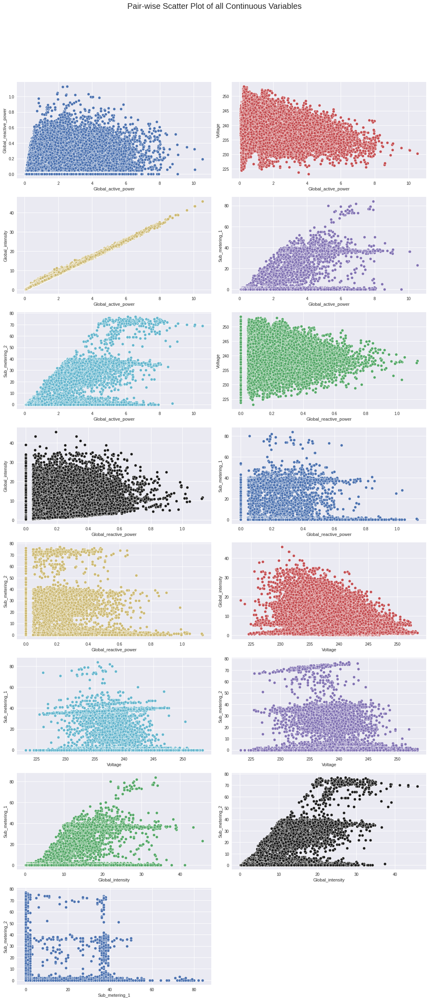

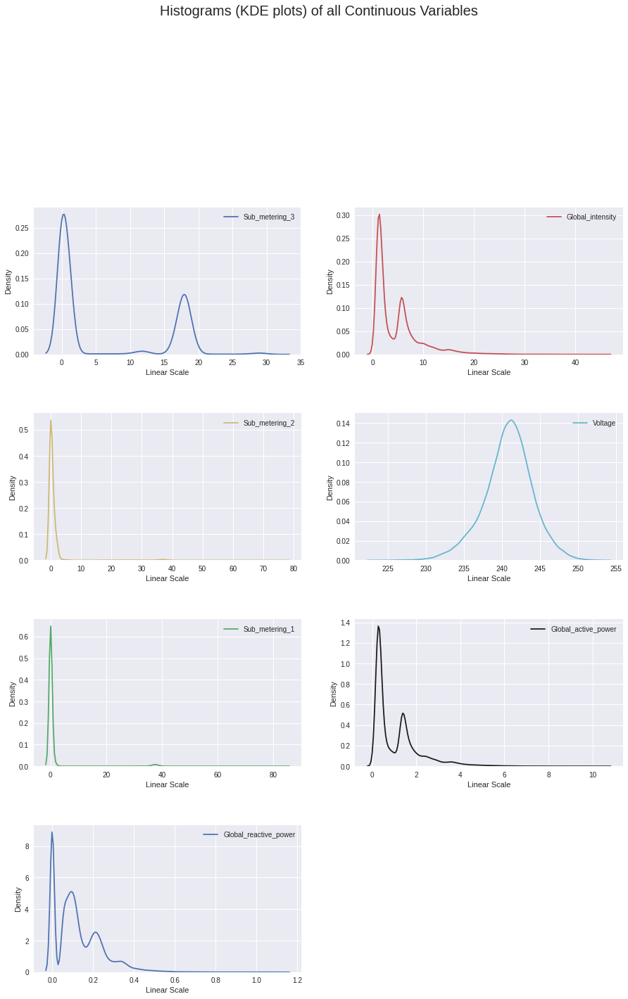

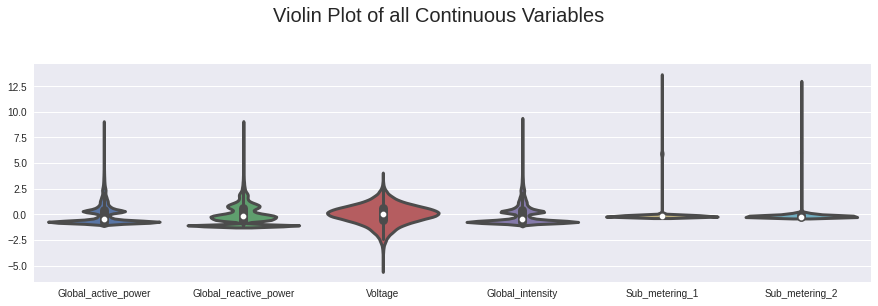

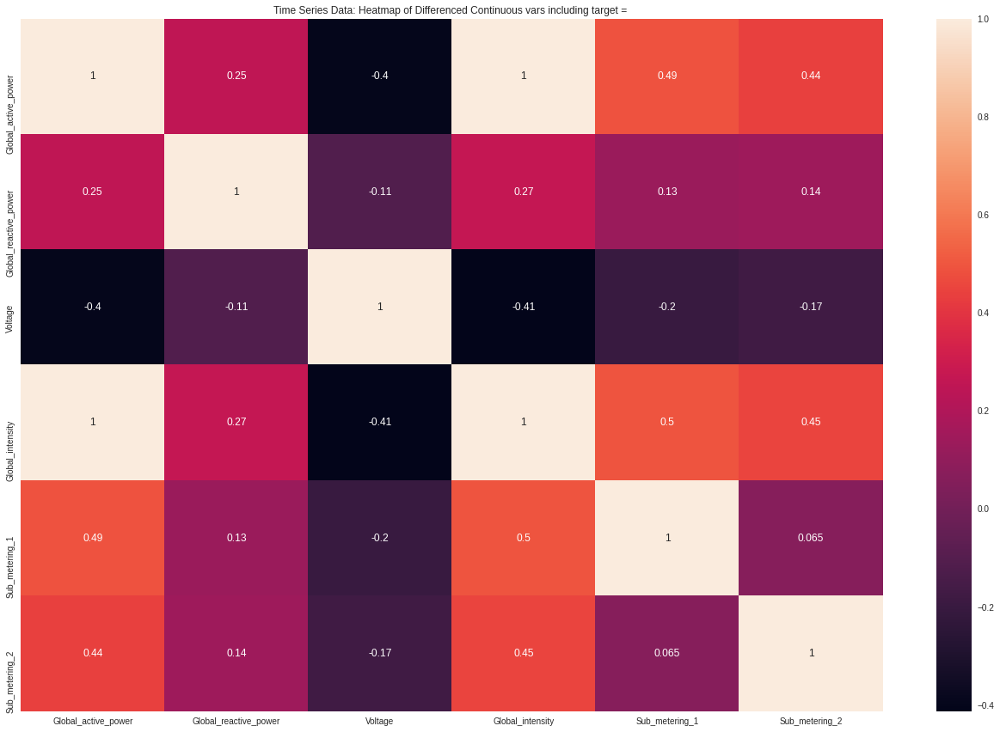

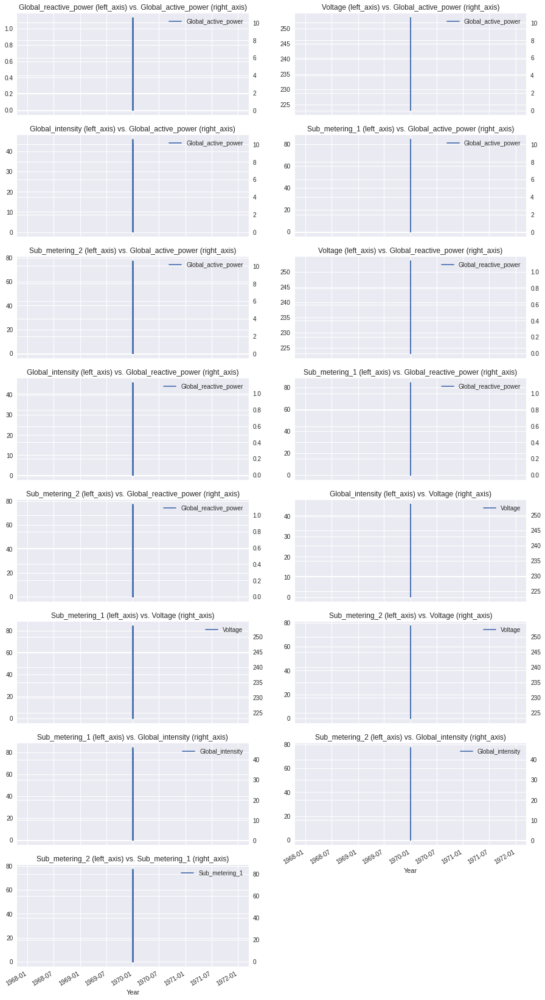

In [ ]:
#install autoviz
!pip install autoviz

#Using autoviz to draw out insight from the data
from autoviz.AutoViz_Class import AutoViz_Class
AV = AutoViz_Class()

#generate the report
report2 = AV.AutoViz('cleaned_data.csv')

In [ ]:
#Checking the analysis after doing some cleaning on the dataset
report3 = pp.ProfileReport(df)

In [ ]:
display(report3)